In [1]:
import cv2
from skimage.feature import hog
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc


testing HOG

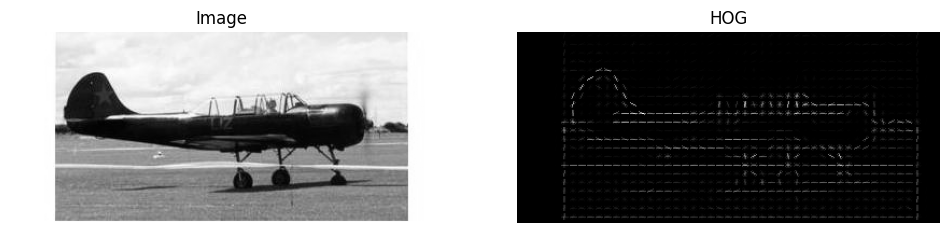

In [2]:
import cv2
import numpy as np
from skimage.feature import hog
import matplotlib.pyplot as plt


image_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\airplane_query.jpg"
image = cv2.imread(image_path)

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

fd, hog_image = hog(
    image_gray,
    orientations=9,
    pixels_per_cell=(8, 8),
    cells_per_block=(2, 2),
    visualize=True,
    channel_axis=None, 
)

# Display
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Image")
plt.imshow(image_gray, cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("HOG")
plt.imshow(hog_image, cmap="gray")
plt.axis("off")

plt.show()


Trying best 5 output with HOG only 4/5 worked

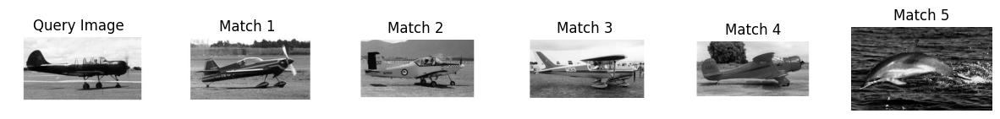

In [3]:
import cv2
from skimage.feature import hog
import numpy as np
import os
import matplotlib.pyplot as plt

dataset_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database"

def compute_hog(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize the image to a fixed size to ensure consistent HOG descriptor length
    image = cv2.resize(image, (128, 64))
    fd, _ = hog(image, orientations=9, pixels_per_cell=(8, 8),
                cells_per_block=(2, 2), visualize=True)
    return fd

image_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.jpg')]
hog_descriptors = [compute_hog(p) for p in image_paths]
hog_descriptors_array = np.array(hog_descriptors)

def compute_distance(query_descriptor, dataset_descriptors):
    distances = np.linalg.norm(dataset_descriptors - query_descriptor, axis=1)
    return distances

query_image = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\airplane_query.jpg"
query_descriptor = compute_hog(query_image)

distances = compute_distance(query_descriptor, hog_descriptors_array)
top_indices = np.argsort(distances)[:5]


plt.figure(figsize=(15, 5))
plt.subplot(1, 6, 1)
plt.title("Query Image")
plt.imshow(cv2.imread(query_image, cv2.IMREAD_GRAYSCALE), cmap="gray")
plt.axis("off")

for i, idx in enumerate(top_indices):
    plt.subplot(1, 6, i + 2)
    plt.title(f"Match {i + 1}")
    plt.imshow(cv2.imread(image_paths[idx], cv2.IMREAD_GRAYSCALE), cmap="gray")
    plt.axis("off")

plt.show()


preprocessing done to improve HOG

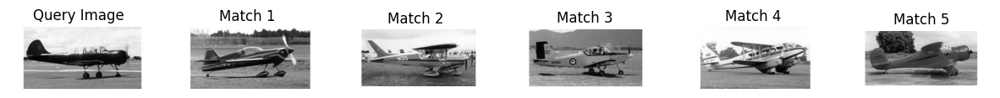

In [4]:
import cv2
from skimage.feature import hog
import numpy as np
import os
import matplotlib.pyplot as plt

dataset_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database"

def compute_hog(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (128, 64))  
    image = cv2.GaussianBlur(image, (5, 5), 0)  
    image = cv2.equalizeHist(image) 
    fd, _ = hog(image, orientations=9, pixels_per_cell=(8, 8),
                cells_per_block=(2, 2), visualize=True)
    fd_normalized = fd / np.linalg.norm(fd) 
    return fd_normalized


image_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.jpg')]
hog_descriptors = [compute_hog(p) for p in image_paths]


hog_descriptors_array = np.array(hog_descriptors)

def compute_distance(query_descriptor, dataset_descriptors):
    distances = np.linalg.norm(dataset_descriptors - query_descriptor, axis=1)
    return distances

query_image = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\airplane_query.jpg"
query_descriptor = compute_hog(query_image)

distances = compute_distance(query_descriptor, hog_descriptors_array)
top_indices = np.argsort(distances)[:5]


plt.figure(figsize=(15, 5))
plt.subplot(1, 6, 1)
plt.title("Query Image")
plt.imshow(cv2.imread(query_image, cv2.IMREAD_GRAYSCALE), cmap="gray")
plt.axis("off")

for i, idx in enumerate(top_indices):
    plt.subplot(1, 6, i + 2)
    plt.title(f"Match {i + 1}")
    plt.imshow(cv2.imread(image_paths[idx], cv2.IMREAD_GRAYSCALE), cmap="gray")
    plt.axis("off")

plt.show()

CLIP

c:\Users\Lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\nn\functional.py:5504: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = scaled_dot_product_attention(q, k, v, attn_mask, dropout_p, is_causal)


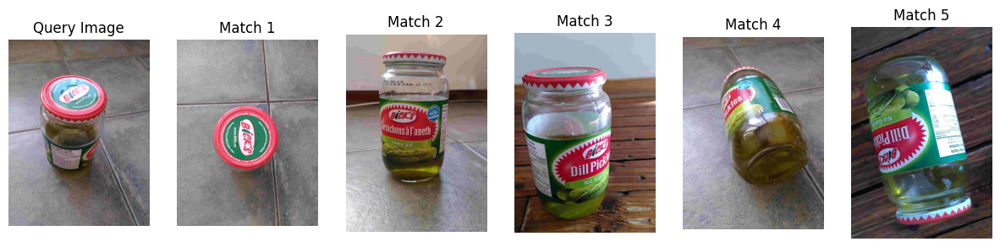

In [5]:
import os
import clip
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# Load the CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device)

dataset_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database"

def get_clip_embedding(image_path):
    image = Image.open(image_path)
    image_input = preprocess(image).unsqueeze(0).to(device)
    
    # Get the image embedding
    with torch.no_grad():
        image_features = model.encode_image(image_input)
    
    # Normalize the image embedding
    image_features = image_features / image_features.norm(dim=-1, keepdim=True)
    return image_features.cpu().numpy()


image_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.jpg')]
image_embeddings = [get_clip_embedding(p) for p in image_paths]


query_image = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\pickles_querry.jpg"
query_embedding = get_clip_embedding(query_image)

#similarity here
similarities = cosine_similarity(query_embedding, np.vstack(image_embeddings))


top_indices = np.argsort(similarities[0])[::-1][:5]


plt.figure(figsize=(15, 5))
plt.subplot(1, 6, 1)
plt.title("Query Image")
plt.imshow(Image.open(query_image))
plt.axis("off")

for i, idx in enumerate(top_indices):
    plt.subplot(1, 6, i + 2)
    plt.title(f"Match {i + 1}")
    plt.imshow(Image.open(image_paths[idx]))
    plt.axis("off")

plt.show()


Another CLIP implementation inspired by hugging face tuto

c:\Users\Lenovo\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


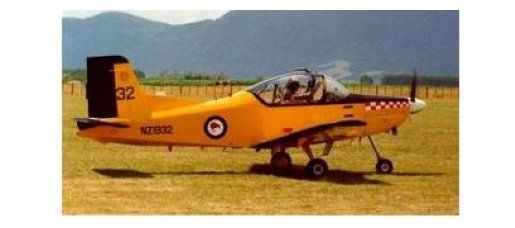

Label probabilities:
a photo of an airplane: 97.08%
a photo of a car: 2.14%
a photo of a ball: 0.05%
a photo of a face: 0.11%
a photo of a cat: 0.11%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.37%
a photo of a strawberry: 0.09%
a photo of a pickles: 0.05%
Predicted class: a photo of an airplane
--------------------------------------------------


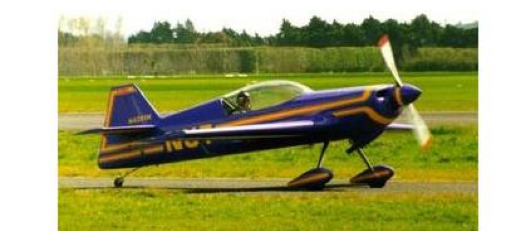

Label probabilities:
a photo of an airplane: 99.37%
a photo of a car: 0.46%
a photo of a ball: 0.00%
a photo of a face: 0.01%
a photo of a cat: 0.01%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.11%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.03%
Predicted class: a photo of an airplane
--------------------------------------------------


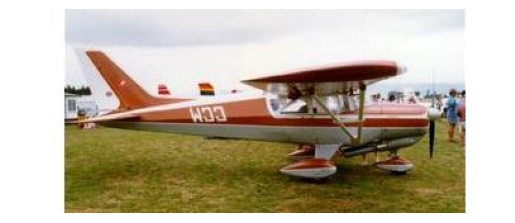

Label probabilities:
a photo of an airplane: 98.00%
a photo of a car: 0.76%
a photo of a ball: 0.01%
a photo of a face: 0.11%
a photo of a cat: 0.04%
a photo of a dolphin: 0.00%
a photo of a lotus: 1.04%
a photo of a strawberry: 0.02%
a photo of a pickles: 0.02%
Predicted class: a photo of an airplane
--------------------------------------------------


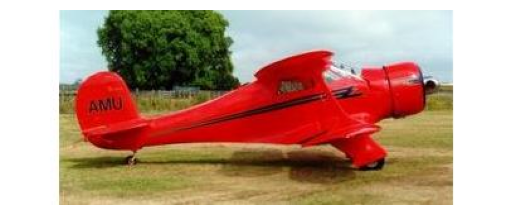

Label probabilities:
a photo of an airplane: 97.62%
a photo of a car: 1.79%
a photo of a ball: 0.01%
a photo of a face: 0.03%
a photo of a cat: 0.01%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.45%
a photo of a strawberry: 0.06%
a photo of a pickles: 0.01%
Predicted class: a photo of an airplane
--------------------------------------------------


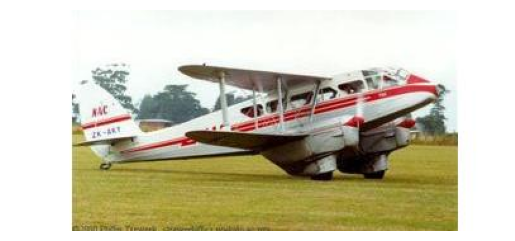

Label probabilities:
a photo of an airplane: 99.83%
a photo of a car: 0.06%
a photo of a ball: 0.00%
a photo of a face: 0.01%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.09%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.01%
Predicted class: a photo of an airplane
--------------------------------------------------


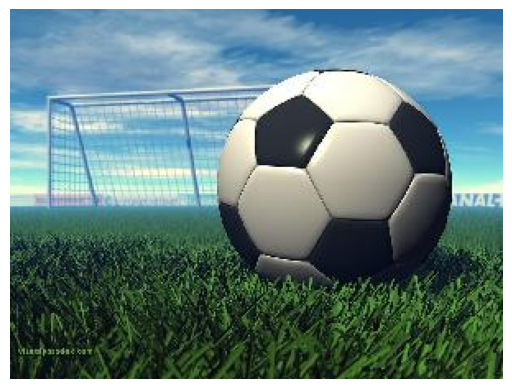

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.11%
a photo of a ball: 99.74%
a photo of a face: 0.07%
a photo of a cat: 0.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.02%
a photo of a pickles: 0.03%
Predicted class: a photo of a ball
--------------------------------------------------


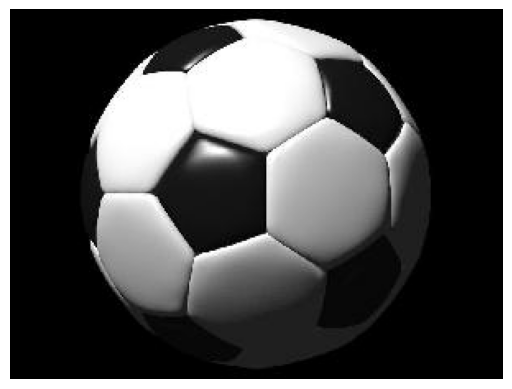

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.11%
a photo of a ball: 99.65%
a photo of a face: 0.18%
a photo of a cat: 0.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.02%
a photo of a pickles: 0.01%
Predicted class: a photo of a ball
--------------------------------------------------


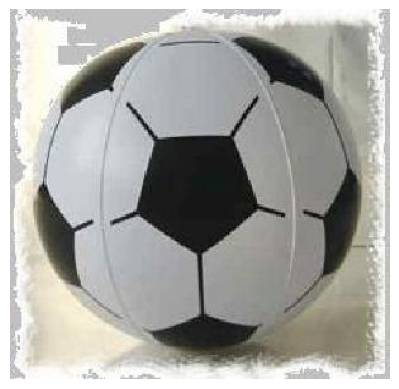

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.03%
a photo of a ball: 99.95%
a photo of a face: 0.01%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.00%
Predicted class: a photo of a ball
--------------------------------------------------


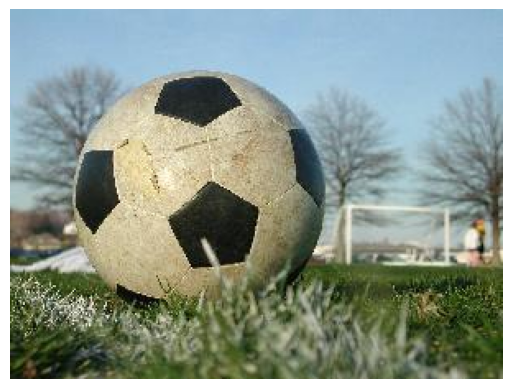

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.04%
a photo of a ball: 99.85%
a photo of a face: 0.05%
a photo of a cat: 0.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.02%
a photo of a pickles: 0.02%
Predicted class: a photo of a ball
--------------------------------------------------


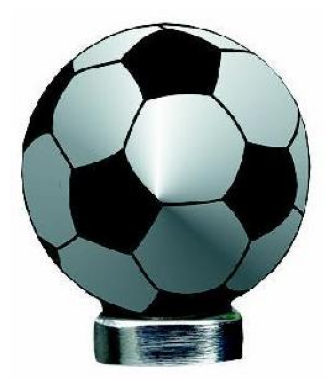

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.21%
a photo of a ball: 99.53%
a photo of a face: 0.22%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.01%
a photo of a pickles: 0.02%
Predicted class: a photo of a ball
--------------------------------------------------


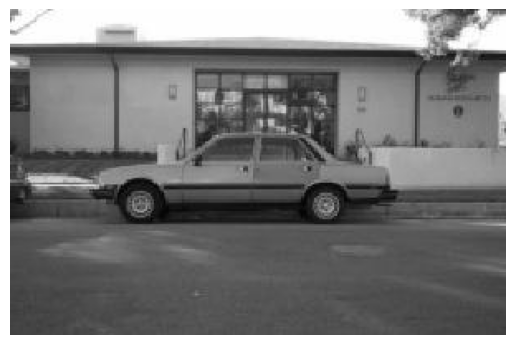

Label probabilities:
a photo of an airplane: 0.03%
a photo of a car: 99.67%
a photo of a ball: 0.02%
a photo of a face: 0.03%
a photo of a cat: 0.02%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.08%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.14%
Predicted class: a photo of a car
--------------------------------------------------


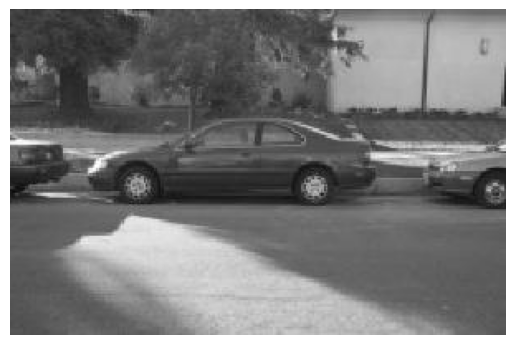

Label probabilities:
a photo of an airplane: 0.02%
a photo of a car: 99.78%
a photo of a ball: 0.04%
a photo of a face: 0.04%
a photo of a cat: 0.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.03%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.07%
Predicted class: a photo of a car
--------------------------------------------------


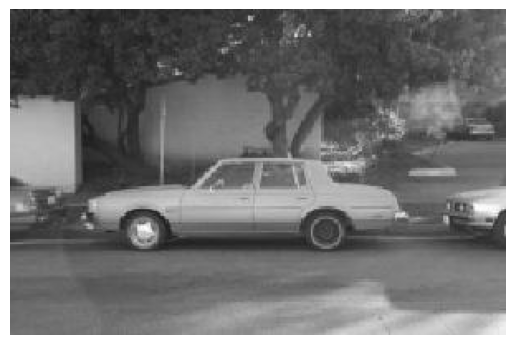

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 99.87%
a photo of a ball: 0.01%
a photo of a face: 0.01%
a photo of a cat: 0.02%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.02%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.07%
Predicted class: a photo of a car
--------------------------------------------------


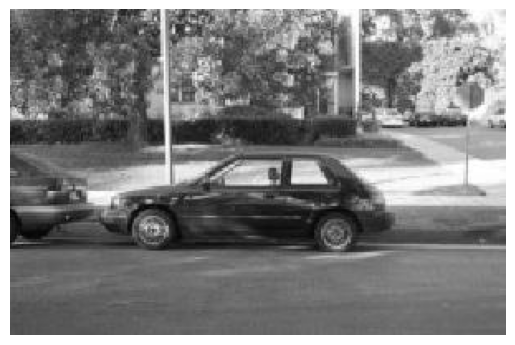

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 99.77%
a photo of a ball: 0.02%
a photo of a face: 0.03%
a photo of a cat: 0.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.13%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.03%
Predicted class: a photo of a car
--------------------------------------------------


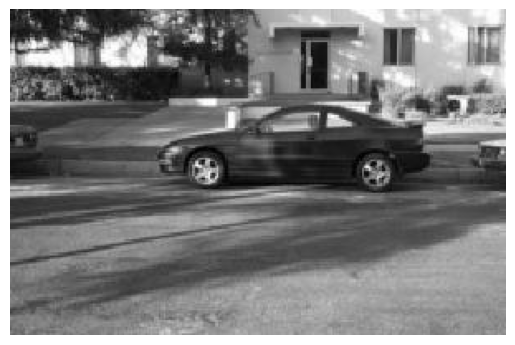

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 99.28%
a photo of a ball: 0.02%
a photo of a face: 0.03%
a photo of a cat: 0.05%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.56%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.05%
Predicted class: a photo of a car
--------------------------------------------------


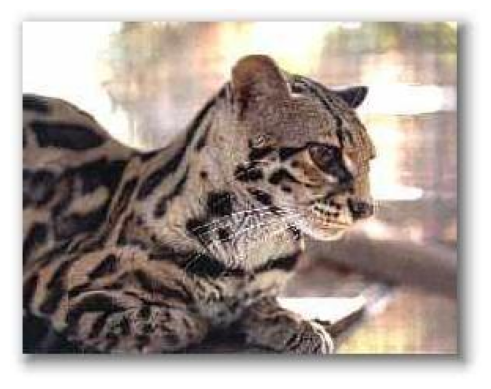

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.31%
a photo of a ball: 0.22%
a photo of a face: 2.07%
a photo of a cat: 97.21%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.18%
Predicted class: a photo of a cat
--------------------------------------------------


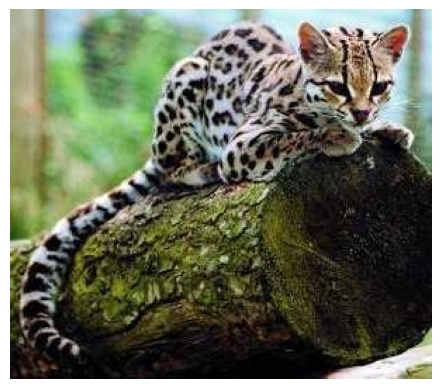

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.37%
a photo of a ball: 0.20%
a photo of a face: 0.46%
a photo of a cat: 98.74%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.02%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.20%
Predicted class: a photo of a cat
--------------------------------------------------


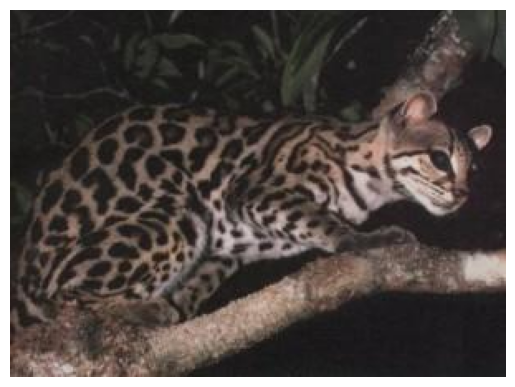

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.46%
a photo of a ball: 0.25%
a photo of a face: 1.58%
a photo of a cat: 97.56%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.01%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.13%
Predicted class: a photo of a cat
--------------------------------------------------


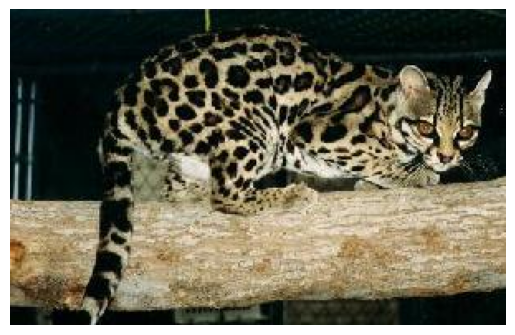

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.39%
a photo of a ball: 0.53%
a photo of a face: 0.68%
a photo of a cat: 98.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.01%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.37%
Predicted class: a photo of a cat
--------------------------------------------------


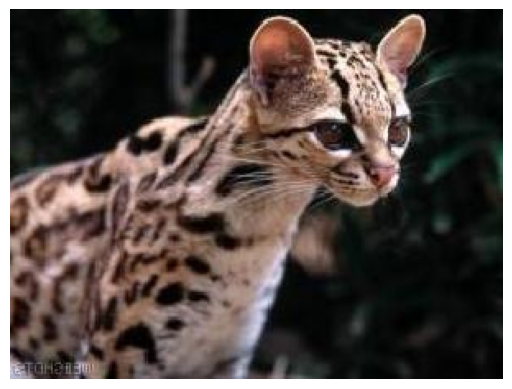

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.08%
a photo of a ball: 0.04%
a photo of a face: 0.99%
a photo of a cat: 98.85%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.04%
Predicted class: a photo of a cat
--------------------------------------------------


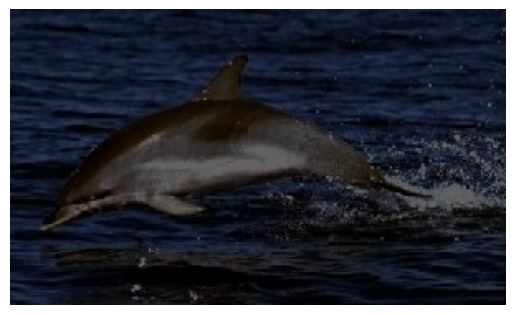

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.01%
a photo of a cat: 0.00%
a photo of a dolphin: 99.99%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.00%
Predicted class: a photo of a dolphin
--------------------------------------------------


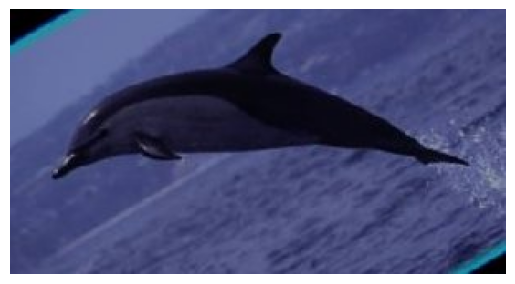

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.01%
a photo of a cat: 0.00%
a photo of a dolphin: 99.97%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.00%
Predicted class: a photo of a dolphin
--------------------------------------------------


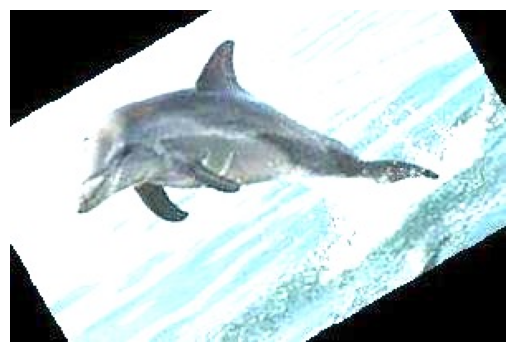

Label probabilities:
a photo of an airplane: 0.04%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.00%
a photo of a cat: 0.01%
a photo of a dolphin: 99.95%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.00%
Predicted class: a photo of a dolphin
--------------------------------------------------


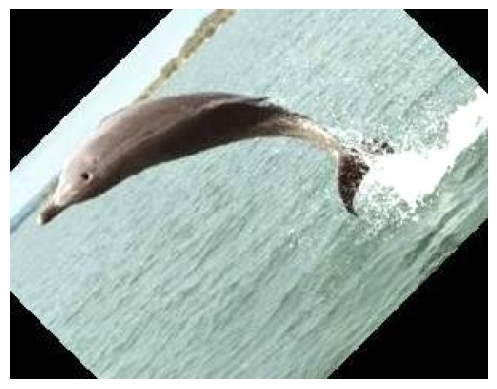

Label probabilities:
a photo of an airplane: 0.02%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.00%
a photo of a cat: 0.00%
a photo of a dolphin: 99.97%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.00%
Predicted class: a photo of a dolphin
--------------------------------------------------


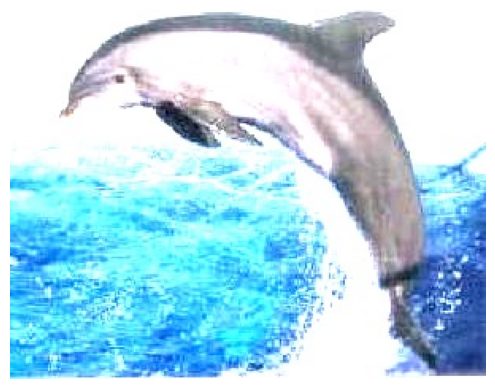

Label probabilities:
a photo of an airplane: 0.01%
a photo of a car: 0.01%
a photo of a ball: 0.05%
a photo of a face: 0.02%
a photo of a cat: 0.03%
a photo of a dolphin: 99.87%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.01%
Predicted class: a photo of a dolphin
--------------------------------------------------


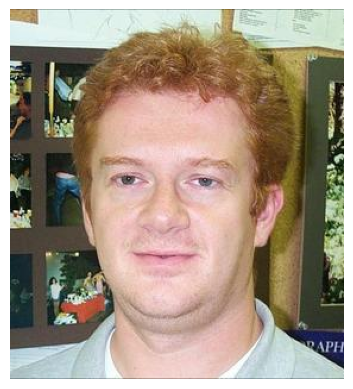

Label probabilities:
a photo of an airplane: 0.06%
a photo of a car: 0.22%
a photo of a ball: 0.57%
a photo of a face: 97.03%
a photo of a cat: 0.58%
a photo of a dolphin: 0.05%
a photo of a lotus: 0.01%
a photo of a strawberry: 0.22%
a photo of a pickles: 1.25%
Predicted class: a photo of a face
--------------------------------------------------


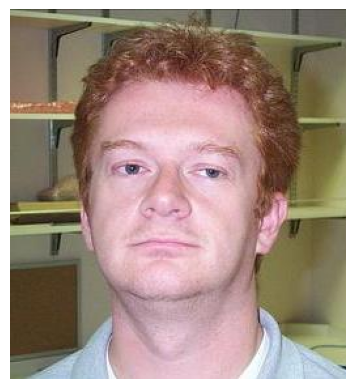

Label probabilities:
a photo of an airplane: 0.05%
a photo of a car: 0.28%
a photo of a ball: 0.20%
a photo of a face: 96.95%
a photo of a cat: 0.32%
a photo of a dolphin: 0.02%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.33%
a photo of a pickles: 1.85%
Predicted class: a photo of a face
--------------------------------------------------


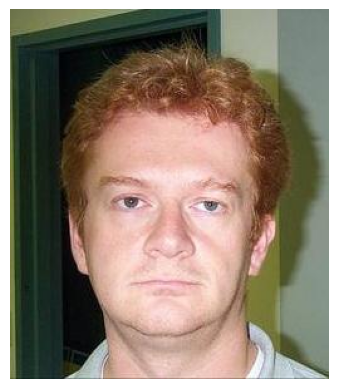

Label probabilities:
a photo of an airplane: 0.05%
a photo of a car: 0.25%
a photo of a ball: 0.17%
a photo of a face: 96.89%
a photo of a cat: 0.32%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.50%
a photo of a pickles: 1.81%
Predicted class: a photo of a face
--------------------------------------------------


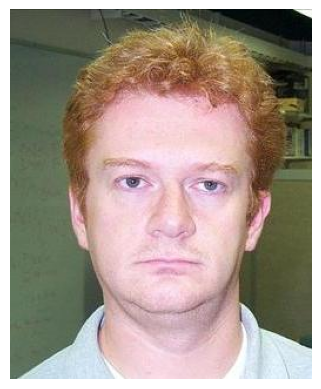

Label probabilities:
a photo of an airplane: 0.02%
a photo of a car: 0.11%
a photo of a ball: 0.07%
a photo of a face: 98.36%
a photo of a cat: 0.09%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.33%
a photo of a pickles: 1.01%
Predicted class: a photo of a face
--------------------------------------------------


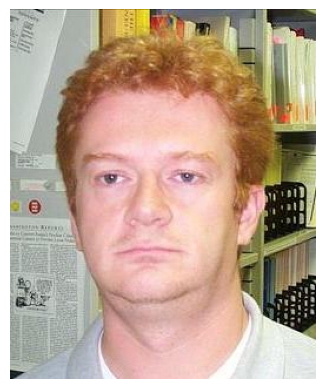

Label probabilities:
a photo of an airplane: 0.02%
a photo of a car: 0.20%
a photo of a ball: 0.18%
a photo of a face: 98.27%
a photo of a cat: 0.28%
a photo of a dolphin: 0.02%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.16%
a photo of a pickles: 0.87%
Predicted class: a photo of a face
--------------------------------------------------


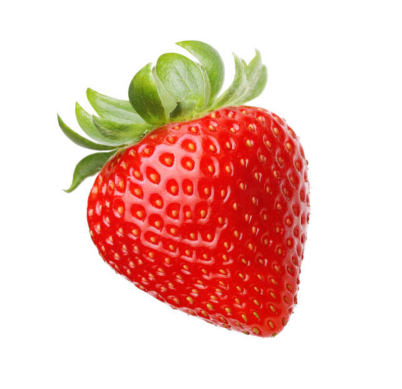

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.00%
a photo of a ball: 0.01%
a photo of a face: 0.01%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 99.98%
a photo of a pickles: 0.00%
Predicted class: a photo of a strawberry
--------------------------------------------------


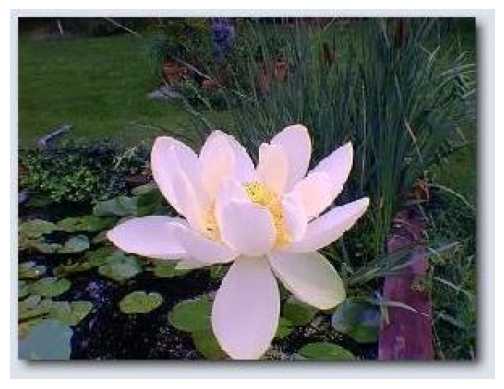

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.01%
a photo of a ball: 0.01%
a photo of a face: 0.09%
a photo of a cat: 0.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 99.88%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.01%
Predicted class: a photo of a lotus
--------------------------------------------------


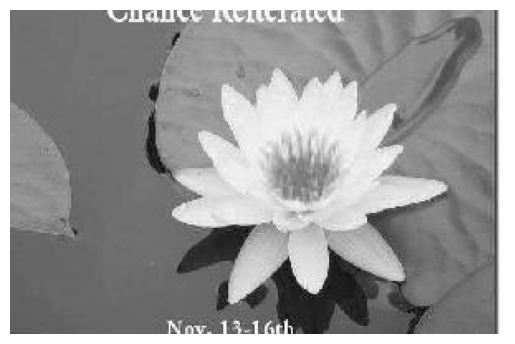

Label probabilities:
a photo of an airplane: 0.38%
a photo of a car: 1.17%
a photo of a ball: 0.05%
a photo of a face: 2.02%
a photo of a cat: 0.03%
a photo of a dolphin: 0.03%
a photo of a lotus: 95.51%
a photo of a strawberry: 0.08%
a photo of a pickles: 0.73%
Predicted class: a photo of a lotus
--------------------------------------------------


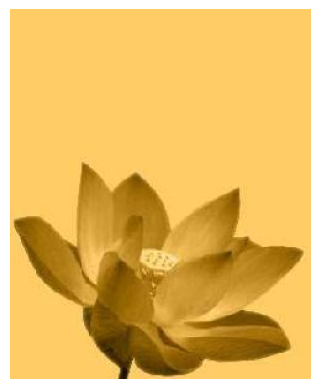

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.02%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 99.96%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.01%
Predicted class: a photo of a lotus
--------------------------------------------------


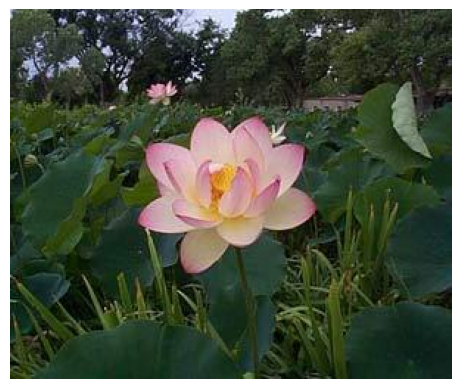

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.01%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 99.99%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.00%
Predicted class: a photo of a lotus
--------------------------------------------------


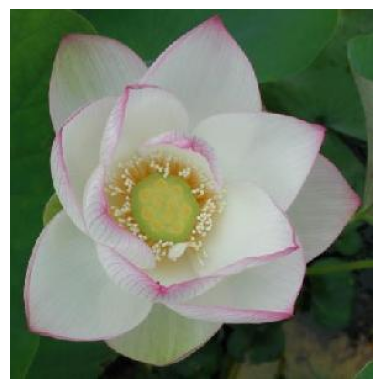

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.03%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 99.96%
a photo of a strawberry: 0.00%
a photo of a pickles: 0.00%
Predicted class: a photo of a lotus
--------------------------------------------------


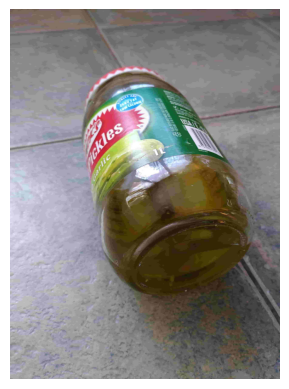

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.01%
a photo of a ball: 0.01%
a photo of a face: 0.02%
a photo of a cat: 0.03%
a photo of a dolphin: 0.01%
a photo of a lotus: 0.01%
a photo of a strawberry: 0.01%
a photo of a pickles: 99.89%
Predicted class: a photo of a pickles
--------------------------------------------------


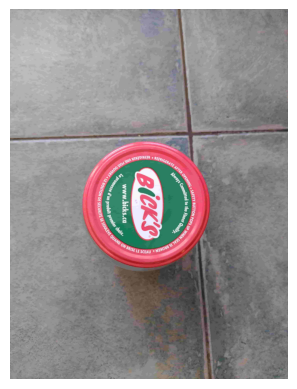

Label probabilities:
a photo of an airplane: 0.13%
a photo of a car: 0.42%
a photo of a ball: 0.79%
a photo of a face: 0.63%
a photo of a cat: 0.35%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.08%
a photo of a strawberry: 0.22%
a photo of a pickles: 97.38%
Predicted class: a photo of a pickles
--------------------------------------------------


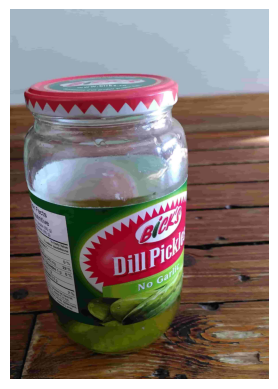

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.00%
a photo of a ball: 0.00%
a photo of a face: 0.01%
a photo of a cat: 0.00%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.00%
a photo of a strawberry: 0.00%
a photo of a pickles: 99.99%
Predicted class: a photo of a pickles
--------------------------------------------------


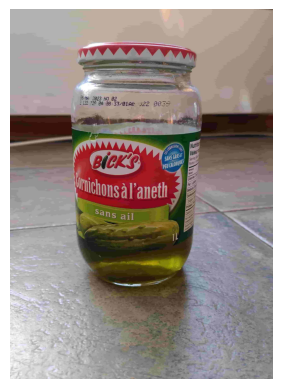

Label probabilities:
a photo of an airplane: 0.00%
a photo of a car: 0.01%
a photo of a ball: 0.03%
a photo of a face: 0.03%
a photo of a cat: 0.01%
a photo of a dolphin: 0.00%
a photo of a lotus: 0.07%
a photo of a strawberry: 0.00%
a photo of a pickles: 99.85%
Predicted class: a photo of a pickles
--------------------------------------------------


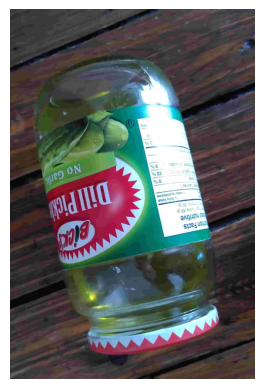

Label probabilities:
a photo of an airplane: 0.03%
a photo of a car: 0.11%
a photo of a ball: 0.33%
a photo of a face: 0.66%
a photo of a cat: 0.08%
a photo of a dolphin: 0.03%
a photo of a lotus: 0.02%
a photo of a strawberry: 0.44%
a photo of a pickles: 98.31%
Predicted class: a photo of a pickles
--------------------------------------------------


In [6]:
import os
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt


model_name = "openai/clip-vit-base-patch16"  
model = CLIPModel.from_pretrained(model_name)
processor = CLIPProcessor.from_pretrained(model_name)

dataset_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database"


text_prompts = ["a photo of an airplane", "a photo of a car", "a photo of a ball", "a photo of a face", "a photo of a cat", "a photo of a dolphin", "a photo of a lotus"
                , "a photo of a strawberry", "a photo of a pickles"] 


image_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.jpg')]


def process_image(image_path):
    
    image = Image.open(image_path).convert("RGB")  
    inputs = processor(
        text=text_prompts,
        images=image,
        return_tensors="pt",
        padding=True
    )

    
    with torch.no_grad():
        outputs = model(**inputs)

    
    logits_per_image = outputs.logits_per_image  
    probs = logits_per_image.softmax(dim=1).squeeze()  

    return image, probs


def display_results(image, probs, text_prompts):
    """
    Displays the image alongside the predicted probabilities for each text prompt.
    """
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    print("Label probabilities:")
    for prompt, prob in zip(text_prompts, probs):
        print(f"{prompt}: {prob:.2%}")

    # Show predicted class
    predicted_class = text_prompts[probs.argmax()]
    print(f"Predicted class: {predicted_class}")
    print("-" * 50)

for image_path in image_paths:
    image, probs = process_image(image_path)
    display_results(image, probs, text_prompts)


CLIP vs HOG

In [7]:
from PIL import Image
import clip
import torch


device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)


def compute_hog(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (128, 64))
    fd, _ = hog(image, orientations=9, pixels_per_cell=(8, 8),
                cells_per_block=(2, 2), visualize=True)
    return fd


def compute_clip(image_path):
    image = Image.open(image_path)
    image = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        features = model.encode_image(image)
    return features.cpu().numpy().flatten()


In [8]:
dataset_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database"

image_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.jpg')]


hog_descriptors = [compute_hog(p) for p in image_paths]
clip_descriptors = [compute_clip(p) for p in image_paths]


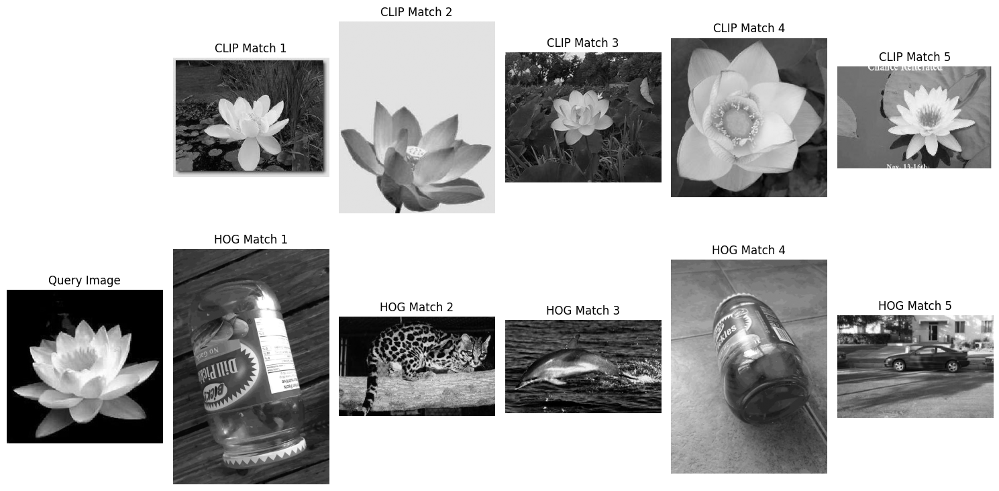

In [9]:

def compute_distance(query_descriptor, dataset_descriptors):
    distances = np.linalg.norm(dataset_descriptors - query_descriptor, axis=1)
    return distances


def top_k_accuracy(true_labels, predicted_labels, k=5):
    correct = 0
    for i in range(len(true_labels)):
        if true_labels[i] in predicted_labels[i][:k]:
            correct += 1
    return correct / len(true_labels)


query_image = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\lotus_query.jpg"
query_hog_descriptor = compute_hog(query_image)
query_clip_descriptor = compute_clip(query_image)

hog_descriptors_array = np.array(hog_descriptors)
clip_descriptors_array = np.array(clip_descriptors)


hog_distances = compute_distance(query_hog_descriptor, hog_descriptors_array)
clip_distances = compute_distance(query_clip_descriptor, clip_descriptors_array)


top_hog_indices = np.argsort(hog_distances)[:5]
top_clip_indices = np.argsort(clip_distances)[:5]

plt.figure(figsize=(15, 15))
plt.subplot(1, 6, 1)
plt.title("Query Image")
plt.imshow(cv2.imread(query_image, cv2.IMREAD_GRAYSCALE), cmap="gray")
plt.axis("off")

for i, idx in enumerate(top_hog_indices):
    plt.subplot(1, 6, i + 2)
    plt.title(f"HOG Match {i + 1}")
    plt.imshow(cv2.imread(image_paths[idx], cv2.IMREAD_GRAYSCALE), cmap="gray")
    plt.axis("off")

for i, idx in enumerate(top_clip_indices):
    plt.subplot(2, 6, i + 2)
    plt.title(f"CLIP Match {i + 1}")
    plt.imshow(cv2.imread(image_paths[idx], cv2.IMREAD_GRAYSCALE), cmap="gray")
    plt.axis("off")

plt.tight_layout()
plt.show()


Hypothesis one : NOISE

<Figure size 1500x500 with 0 Axes>

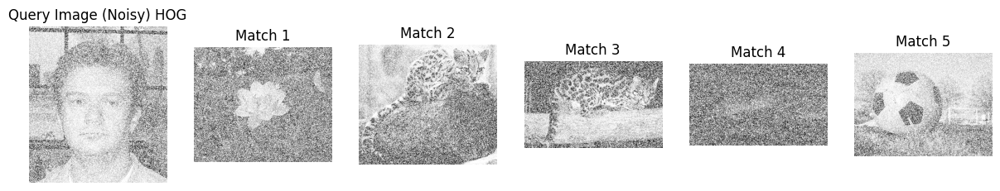

<Figure size 1500x500 with 0 Axes>

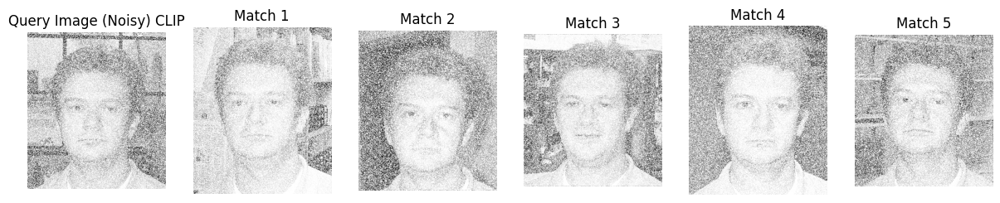

In [ ]:
import cv2
from skimage.feature import hog
import numpy as np
import os
import matplotlib.pyplot as plt
import torch
from transformers import CLIPProcessor, CLIPModel

dataset_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database"

# Function to add Gaussian noise to images
def add_gaussian_noise(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype('uint8')
    noisy_image = cv2.add(image, noise)
    return noisy_image

def compute_hog(image):
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Resize image for consistent feature extraction
    image_resized = cv2.resize(image_gray, (128, 64))
    fd, _ = hog(image_resized, orientations=9, pixels_per_cell=(8, 8),
                cells_per_block=(2, 2), visualize=True)
    return fd

image_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.jpg')]

image_data = [cv2.imread(img) for img in image_paths]
hog_descriptors = [compute_hog(img) for img in image_data]

hog_descriptors_array = np.array(hog_descriptors)

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def compute_clip(image):
    inputs = clip_processor(images=image, return_tensors="pt")
    with torch.no_grad():
        image_features = clip_model.get_image_features(**inputs)
    return image_features.squeeze().cpu().numpy()

clip_features = [compute_clip(img) for img in image_data]

def compute_distance(query_descriptor, dataset_descriptors):
    distances = np.linalg.norm(dataset_descriptors - query_descriptor, axis=1)
    return distances

query_image = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\face_query.jpg"

# Compute the HOG descriptor for the query image
query_image_data = cv2.imread(query_image)
query_descriptor_hog = compute_hog(query_image_data)

# Compute the CLIP descriptor for the query image
query_descriptor_clip = compute_clip(query_image_data)

# Add Gaussian noise to the query and database images
query_image_noisy = add_gaussian_noise(query_image_data)
noisy_image_data = [add_gaussian_noise(img) for img in image_data]

# Compute distances for clean and noisy images using HOG
distances_clean_hog = compute_distance(query_descriptor_hog, hog_descriptors_array)
distances_noisy_hog = compute_distance(compute_hog(query_image_noisy), hog_descriptors_array)

# Compute distances for clean and noisy images using CLIP
distances_clean_clip = compute_distance(query_descriptor_clip, clip_features)
distances_noisy_clip = compute_distance(compute_clip(query_image_noisy), clip_features)

# Get the top-5 most similar images based on the distances
top_indices_clean_hog = np.argsort(distances_clean_hog)[:5]
top_indices_noisy_hog = np.argsort(distances_noisy_hog)[:5]
top_indices_clean_clip = np.argsort(distances_clean_clip)[:5]
top_indices_noisy_clip = np.argsort(distances_noisy_clip)[:5]

# Visualization of results for clean and noisy query images using HOG
plt.figure(figsize=(15, 5))



# Visualization of results for Noisy Query using HOG
plt.figure(figsize=(15, 5))

# Noisy Query Image using HOG
plt.subplot(1, 6, 1)
plt.title("Query Image (Noisy) HOG")
plt.imshow(cv2.cvtColor(query_image_noisy, cv2.COLOR_BGR2GRAY), cmap="gray")
plt.axis("off")

# Top-5 Matches for Noisy Query using HOG
for i, idx in enumerate(top_indices_noisy_hog):
    plt.subplot(1, 6, i + 2)
    plt.title(f"Match {i + 1}")
    plt.imshow(cv2.cvtColor(noisy_image_data[idx], cv2.COLOR_BGR2GRAY), cmap="gray")
    plt.axis("off")

plt.show()


plt.figure(figsize=(15, 5))




plt.figure(figsize=(15, 5))

# Noisy Query Image using CLIP
plt.subplot(1, 6, 1)
plt.title("Query Image (Noisy) CLIP")
plt.imshow(cv2.cvtColor(query_image_noisy, cv2.COLOR_BGR2GRAY), cmap="gray")
plt.axis("off")

# Top-5 Matches for Noisy Query using CLIP
for i, idx in enumerate(top_indices_noisy_clip):
    plt.subplot(1, 6, i + 2)
    plt.title(f"Match {i + 1}")
    plt.imshow(cv2.cvtColor(noisy_image_data[idx], cv2.COLOR_BGR2GRAY), cmap="gray")
    plt.axis("off")

plt.show()


Hypothesis 2 : structured vs unstructured objects

We can see the diffrence between a plane (structured objects with clear shapes) and a jar of pickles (unstructured with round and unclear textures)

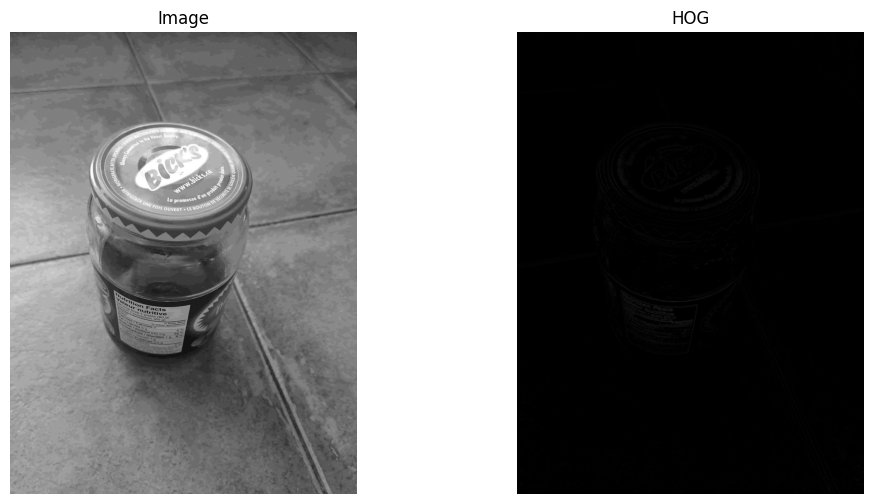

In [ ]:
import cv2
import numpy as np
from skimage.feature import hog
import matplotlib.pyplot as plt


image_path = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\pickles_querry.jpg"
image = cv2.imread(image_path)

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

fd, hog_image = hog(
    image_gray,
    orientations=9,
    pixels_per_cell=(8, 8),
    cells_per_block=(2, 2),
    visualize=True,
    channel_axis=None, 
)


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Image")
plt.imshow(image_gray, cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("HOG")
plt.imshow(hog_image, cmap="gray")
plt.axis("off")

plt.show()


Hypothesis 3 : Bounding Box effect on both models

In [13]:
import cv2
import numpy as np
from skimage.feature import hog
import os
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def load_yolo_annotations(annotation_file, image_width, image_height):
    """Load YOLO bounding box annotations and convert to absolute coordinates."""
    bboxes = []
    with open(annotation_file, "r") as f:
        for line in f:
            class_id, center_x, center_y, width, height = map(float, line.strip().split())
            x_min = int((center_x - width / 2) * image_width)
            y_min = int((center_y - height / 2) * image_height)
            x_max = int((center_x + width / 2) * image_width)
            y_max = int((center_y + height / 2) * image_height)
            bboxes.append((int(x_min), int(y_min), int(x_max - x_min), int(y_max - y_min)))
    return bboxes

def compute_hog(image, bbox=None, resize_to=(128, 128)):
    """Compute HOG descriptor with consistent dimensions."""
    if bbox:
        x, y, w, h = bbox
        image = image[y:y+h, x:x+w]
    image_resized = cv2.resize(image, resize_to) 
    gray = cv2.cvtColor(image_resized, cv2.COLOR_BGR2GRAY)
    descriptor = hog(gray, orientations=8, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False)
    return descriptor

def compute_clip_features(image, bbox=None, resize_to=(224, 224)):
    """Compute CLIP features with consistent dimensions."""
    if bbox:
        x, y, w, h = bbox
        image = image[y:y+h, x:x+w]
    image_resized = cv2.resize(image, resize_to)  # Resize to match CLIP input size
    image_tensor = clip_processor(images=image_resized, return_tensors="pt")["pixel_values"]
    features = clip_model.get_image_features(image_tensor)
    return features.detach().numpy().flatten()

def similarity(descriptor1, descriptor2, method="cosine"):
    """Compute similarity between two descriptors."""
    if method == "cosine":
        return np.dot(descriptor1, descriptor2) / (np.linalg.norm(descriptor1) * np.linalg.norm(descriptor2))
    elif method == "euclidean":
        return np.linalg.norm(descriptor1 - descriptor2)

# Sample dataset
image_folder = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database"  # Replace with your image folder path
annotation_folder = "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\ann-data\\train\\labels\\"  # Replace with your YOLO annotations folder path

results = []
for image_file in os.listdir(image_folder):
    if image_file.endswith(".jpg") or image_file.endswith(".png"):
        image_path = os.path.join(image_folder, image_file)
        annotation_file = os.path.join(annotation_folder, os.path.splitext(image_file)[0] + ".txt")
        
        image = cv2.imread(image_path)
        height, width, _ = image.shape
        
        # Load bounding boxes
        bounding_boxes = load_yolo_annotations(annotation_file, width, height)
        
        # Full image descriptors
        hog_full = compute_hog(image)
        clip_full = compute_clip_features(image)
        
        # Bounding box descriptors
        for bbox in bounding_boxes:
            hog_bbox = compute_hog(image, bbox)
            clip_bbox = compute_clip_features(image, bbox)
            
            # Compute similarity (example: between full image and bounding box)
            hog_sim = similarity(hog_full, hog_bbox)
            clip_sim = similarity(clip_full, clip_bbox)
            
            results.append({
                "image": image_file,
                "bbox": bbox,
                "hog_similarity": hog_sim,
                "clip_similarity": clip_sim
            })

# Analyze results
for result in results:
    print(f"Image: {result['image']}, BBox: {result['bbox']}")
    print(f"  HOG Similarity: {result['hog_similarity']:.4f}")
    print(f"  CLIP Similarity: {result['clip_similarity']:.4f}")


Image: airplane_1.jpg, BBox: (50, 29, 282, 107)
  HOG Similarity: 0.6790
  CLIP Similarity: 0.8819
Image: airplane_2.jpg, BBox: (51, 19, 292, 130)
  HOG Similarity: 0.6802
  CLIP Similarity: 0.9286
Image: airplane_3.jpg, BBox: (47, 19, 294, 121)
  HOG Similarity: 0.6693
  CLIP Similarity: 0.8998
Image: airplane_4.jpg, BBox: (49, 26, 293, 104)
  HOG Similarity: 0.6437
  CLIP Similarity: 0.9184
Image: airplane_5.jpg, BBox: (50, 40, 296, 98)
  HOG Similarity: 0.5810
  CLIP Similarity: 0.9126
Image: ball_1.jpg, BBox: (119, 31, 149, 138)
  HOG Similarity: 0.6215
  CLIP Similarity: 0.9307
Image: ball_2.jpg, BBox: (36, 4, 225, 217)
  HOG Similarity: 0.4939
  CLIP Similarity: 0.9504
Image: ball_3.jpg, BBox: (14, 11, 263, 262)
  HOG Similarity: 0.7114
  CLIP Similarity: 0.9687
Image: ball_4.jpg, BBox: (36, 31, 159, 155)
  HOG Similarity: 0.7172
  CLIP Similarity: 0.9525
Image: ball_5.jpg, BBox: (7, 4, 238, 251)
  HOG Similarity: 0.5412
  CLIP Similarity: 0.9680
Image: car_1.jpg, BBox: (50, 69, 

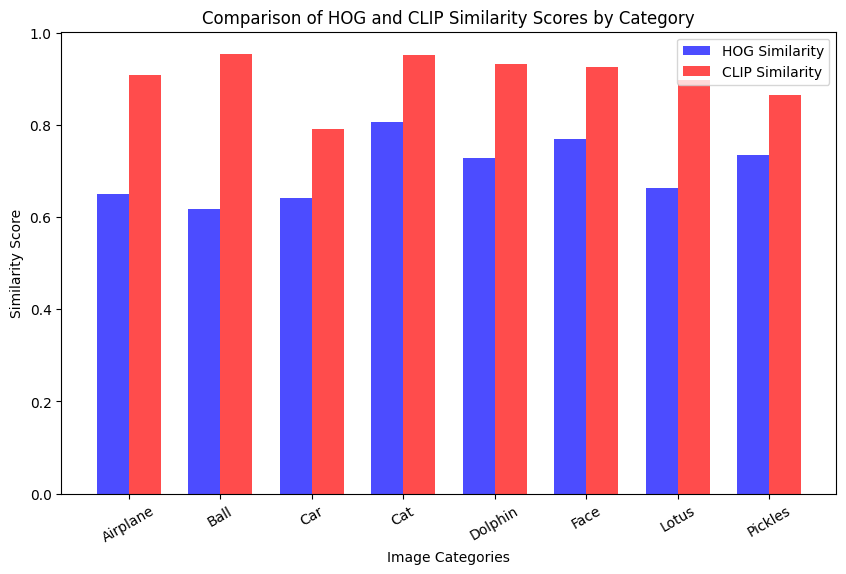

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


categories = ["Airplane", "Ball", "Car", "Cat", "Dolphin", "Face", "Lotus", "Pickles"]


hog_similarities = [
    np.mean([0.6790, 0.6802, 0.6693, 0.6437, 0.5810]),  # Airplane
    np.mean([0.6215, 0.4939, 0.7114, 0.7172, 0.5412]),  # Ball
    np.mean([0.5740, 0.6457, 0.6611, 0.6759, 0.6503]),  # Car
    np.mean([0.7324, 0.9213, 0.7888, 0.8533, 0.7345]),  # Cat
    np.mean([0.8376, 0.6933, 0.5759, 0.6967, 0.8360]),  # Dolphin
    np.mean([0.7653, 0.7428, 0.7675, 0.7765, 0.7922]),  # Face
    np.mean([0.6629, 0.6506, 0.4344, 0.6967, 0.8707]),  # Lotus
    np.mean([0.7613, 0.7042, 0.7092, 0.7167, 0.7840])   # Pickles
]

clip_similarities = [
    np.mean([0.8819, 0.9286, 0.8998, 0.9184, 0.9126]),  # Airplane
    np.mean([0.9307, 0.9504, 0.9687, 0.9525, 0.9680]),  # Ball
    np.mean([0.7991, 0.7983, 0.7915, 0.8031, 0.7675]),  # Car
    np.mean([0.9646, 0.9680, 0.9228, 0.9249, 0.9759]),  # Cat
    np.mean([0.9324, 0.9044, 0.9080, 0.9438, 0.9722]),  # Dolphin
    np.mean([0.8959, 0.9110, 0.9488, 0.9213, 0.9459]),  # Face
    np.mean([0.9026, 0.7777, 0.9655, 0.8567, 0.9824]),  # Lotus
    np.mean([0.9264, 0.8506, 0.8997, 0.7571, 0.8938])   # Pickles
]

# Create the bar chart
x = np.arange(len(categories))  # Category indices
width = 0.35  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))
bars1 = ax.bar(x - width/2, hog_similarities, width, label='HOG Similarity', color='blue', alpha=0.7)
bars2 = ax.bar(x + width/2, clip_similarities, width, label='CLIP Similarity', color='red', alpha=0.7)

# Add labels and title
ax.set_xlabel("Image Categories")
ax.set_ylabel("Similarity Score")
ax.set_title("Comparison of HOG and CLIP Similarity Scores by Category")
ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=30)
ax.legend()

# Display the chart
plt.show()


In [16]:
import torch
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import time
import numpy as np
import pandas as pd

# Define CLIP models to test
models = {
    "ViT-B/32": "openai/clip-vit-base-patch32",
    "ViT-B/16": "openai/clip-vit-base-patch16",
    "ViT-L/14": "openai/clip-vit-large-patch14"
}

# Patch sizes to simulate
patch_sizes = [224, 128, 64]

# Dataset (replace with actual image paths)
image_paths = [
    "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database\\airplane_1.jpg",
    "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database\\airplane_2.jpg",
    "C:\\Users\\Lenovo\\Desktop\\comp-vison-chap1\\TP1\\TP1_data\\database\\airplane_3.jpg"
]

# Results storage
results = []

# Function to preprocess and extract features
def extract_features(image_path, model_name, patch_size):
    """Extract features for an image using a specific CLIP model and patch size."""
    model = CLIPModel.from_pretrained(models[model_name])
    processor = CLIPProcessor.from_pretrained(models[model_name])
    
    # Load and resize the image
    image = Image.open(image_path).convert("RGB")
    image_resized = image.resize((patch_size, patch_size))  
    
    # Preprocess and extract features
    inputs = processor(images=image_resized, return_tensors="pt")
    start_time = time.time()
    features = model.get_image_features(**inputs)
    end_time = time.time()
    
    return features.detach().numpy().flatten(), end_time - start_time

# Main loop for feature extraction
for model_name in models:
    for patch_size in patch_sizes:
        for image_path in image_paths:
            features, duration = extract_features(image_path, model_name, patch_size)
            results.append({
                "model": model_name,
                "patch_size": patch_size,
                "image": image_path,
                "computation_time": duration,
                "features": features  
            })


df = pd.DataFrame(results)


summary_results = []
for model_name in models:
    for patch_size in patch_sizes:
        
        subset = df[(df["model"] == model_name) & (df["patch_size"] == patch_size)]
        
        
        similarities = []
        subset_features = subset["features"].tolist()
        for i in range(len(subset_features)):
            for j in range(i + 1, len(subset_features)):
                sim = np.dot(subset_features[i], subset_features[j]) / (
                    np.linalg.norm(subset_features[i]) * np.linalg.norm(subset_features[j])
                )
                similarities.append(sim)
        
        # Aggregate results
        avg_similarity = np.mean(similarities) if similarities else 0
        avg_time = subset["computation_time"].mean()
        summary_results.append({
            "Model": model_name,
            "Patch Size": patch_size,
            "Average Similarity": avg_similarity,
            "Average Computation Time (s)": avg_time
        })


summary_df = pd.DataFrame(summary_results)

# Display full table
print("\nSummary of Results:")
print(summary_df)
summary_df.to_csv("clip_model_comparison.csv", index=False)



Summary of Results:
      Model  Patch Size  Average Similarity  Average Computation Time (s)
0  ViT-B/32         224            0.848176                      0.181514
1  ViT-B/32         128            0.853844                      0.165546
2  ViT-B/32          64            0.870377                      0.134308
3  ViT-B/16         224            0.837642                      0.420210
4  ViT-B/16         128            0.846126                      0.399264
5  ViT-B/16          64            0.905478                      0.410569
6  ViT-L/14         224            0.808431                      2.730696
7  ViT-L/14         128            0.840199                      2.210592
8  ViT-L/14          64            0.835348                      2.110686
